<a href="https://colab.research.google.com/github/enginerzin/enginerzin/blob/main/colab_conv1.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# Initialization: Libraries, files

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:7: WavFileWarning: Reached EOF prematurely; finished at 6291456 bytes, expected 42359568 bytes from header.
  import sys


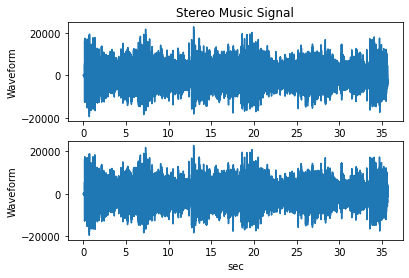

In [1]:
from IPython.display import Audio
import numpy as np
import matplotlib.pyplot as plt
import scipy.io.wavfile

#Fs, music = scipy.io.wavfile.read('JSBach_Sonata.wav')
Fs, music = scipy.io.wavfile.read('FurElise.wav')

Fl = len(music[:,0])
#print(Fs, Fl)

Time = np.linspace(0, Fl / Fs, num=Fl)

plt.figure(1)

plot_a = plt.subplot(211)
plot_a.set_title('Stereo Music Signal')
plot_a.plot(Time, music[:,0])
plot_a.set_xlabel('sec')
plot_a.set_ylabel('Waveform')

plot_b = plt.subplot(212)
plot_b.plot(Time, music[:,1])
plot_b.set_xlabel('sec')
plot_b.set_ylabel('Waveform')

plt.show()


# Sound Propagation Through Reflections

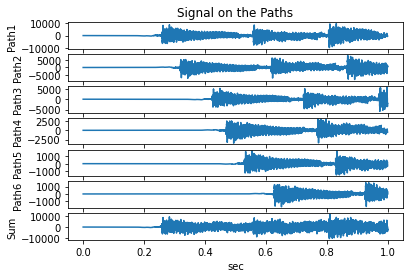

In [10]:
# From source to target listener, assume there are 6 sound propagation paths
LengthofPaths = [30, 50, 85, 100, 120, 152] # meters
MagnitudeofPaths = [0.5, -0.4, 0.3, -0.2, 0.1, -0.1] # attenuation for each path
SpeedofSound = 331.4 # meters/second

DelayofPaths = []
SampleDelayofPaths = []
PathsL = np.zeros( (len(LengthofPaths), Fl))
PathsR = np.zeros( (len(LengthofPaths), Fl))
Outmusic = np.zeros( (Fl, 2))

for lenP in LengthofPaths:
    DelayofPaths.append(lenP / SpeedofSound)
    SampleDelayofPaths.append(int(Fs*lenP/SpeedofSound))
    
for k in range(len(DelayofPaths)):
    PathsL[k,SampleDelayofPaths[k]:] = MagnitudeofPaths[k]*music[:Fl-SampleDelayofPaths[k],0]
    PathsR[k,SampleDelayofPaths[k]:] = MagnitudeofPaths[k]*music[:Fl-SampleDelayofPaths[k],1]
    Outmusic[:,0] += PathsL[k,:]
    Outmusic[:,1] += PathsR[k,:]

scipy.io.wavfile.write('OUT_music.wav', Fs, data=Outmusic.astype(np.int16))

plt.figure(2)

plot_a = plt.subplot(711)
plot_a.set_title('Signal on the Paths')
plot_a.plot(Time[0:Fs], PathsL[0,0:Fs])
plot_a.set_xlabel('sec')
plot_a.set_ylabel('Path1')

plot_b = plt.subplot(712)
plot_b.plot(Time[0:Fs], PathsL[1,0:Fs])
plot_b.set_xlabel('sec')
plot_b.set_ylabel('Path2')

plot_c = plt.subplot(713)
plot_c.plot(Time[0:Fs], PathsL[2,0:Fs])
plot_c.set_xlabel('sec')
plot_c.set_ylabel('Path3')

plot_d = plt.subplot(714)
plot_d.plot(Time[0:Fs], PathsL[3,0:Fs])
plot_d.set_xlabel('sec')
plot_d.set_ylabel('Path4')

plot_e = plt.subplot(715)
plot_e.plot(Time[0:Fs], PathsL[4,0:Fs])
plot_e.set_xlabel('sec')
plot_e.set_ylabel('Path5')

plot_f = plt.subplot(716)
plot_f.plot(Time[0:Fs], PathsL[5,0:Fs])
plot_f.set_xlabel('sec')
plot_f.set_ylabel('Path6')

plot_g = plt.subplot(717)
plot_g.plot(Time[0:Fs], Outmusic[0:Fs,0])
plot_g.set_xlabel('sec')
plot_g.set_ylabel('Sum')

plt.show()

In [3]:
Audio(filename='FurElise.wav', rate=Fs)

In [4]:
Audio(Outmusic[:,0], rate=Fs)